<h1 style="color: #aadafa; text-align: center; font-size: 48px; margin-bottom: 0.2em;">
PW 3 - SAR statistics
<h1>
<p style="text-align: center; font-size: 18px; margin-top: 0.5em;">
<strong> Marie Pizzini</strong> 
</p>
<p style="text-align: center; font-size: 18px; margin-top: 0.5em;">
Telecom Paris - June 2024
</p>

### Statistics and despeckling

The practical work is divided in 3 parts

- A. empirical checking of the distributions seen in course for synthetic speckle
- B. computation of equivalent number of looks using images of physically homogeneous areas
- C. spatial multi-looking and implementation of the Lee filter

You have at your disposal several images of various areas acquired by different acquisition modes.
- An oceanfront in São-Paulo acquired by Sentinel-1 sensor (ESA) in GRD (Ground Range Detected) mode
- A farmland near from Bologne (Italy) acquired by TerraSAR-X sensor (ESA) in MGD (Multi Look Ground Range Detected) mode
- An area near from Rome acquired by TerraSAR-X sensor (ESA) in SLC (Single Look Complex) mode
- A temporal stack of images acquired at Flevoland in Netherlands by Alos sensor (JAXA) in SLC mode

Some useful functions are available in the file *mvalab.py*.

#### Instructions

To solve this practical session, answer the questions below. Then export the notebook with the answers using the menu option **File -> Download as -> Notebook (.ipynb)**. Then [submit the resulting file on e-campus by next week.

### Import the libraries and packages we are going to use
The following cell imports all that is going to be necessary for the practical work

In [2]:
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/mvalab.py

--2024-06-11 17:37:13--  https://perso.telecom-paristech.fr/tupin/TPSAR/mvalab.py
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68071 (66K) [text/x-python]
Saving to: ‘mvalab.py’

mvalab.py           100%[===================>]  66.48K  --.-KB/s    in 0.09s   

2024-06-11 17:37:14 (736 KB/s) - ‘mvalab.py’ saved [68071/68071]



In [3]:
import scipy
from scipy import signal
import scipy.signal
import scipy as spy
import scipy.fftpack
from scipy import ndimage
from scipy import special
from scipy import ndimage
import numpy as np
import math
import matplotlib.pyplot as plt
import mvalab as mvalab
from urllib.request import urlopen
import cmath

plt.rcParams['figure.figsize'] = [15, 15]
plt.rcParams['figure.max_open_warning'] = 30

## A. Single look data distributions

In this part, we will simulate an SLC (Single Look Complex) SAR image representing an homogeneous area and analyze the pdfs of its intensity and phase.

#### Single look data simulation

According to the Goodman model, the real and imaginary parts of each pixel of an SLC SAR image are independent and identically distributed according to a Gaussian distribution centered and of variance equal to the reflectivity of the pixel divided by 2.\
Choose randomly a reflectity value $R$ in the interval $[100, 200]$ and create a SLC SAR image of size $150\times 150$ representing an homogeneous area of reflectivity $R$.

Affichage d'une image reelle
plt.show dans visusar : image 150 x 150


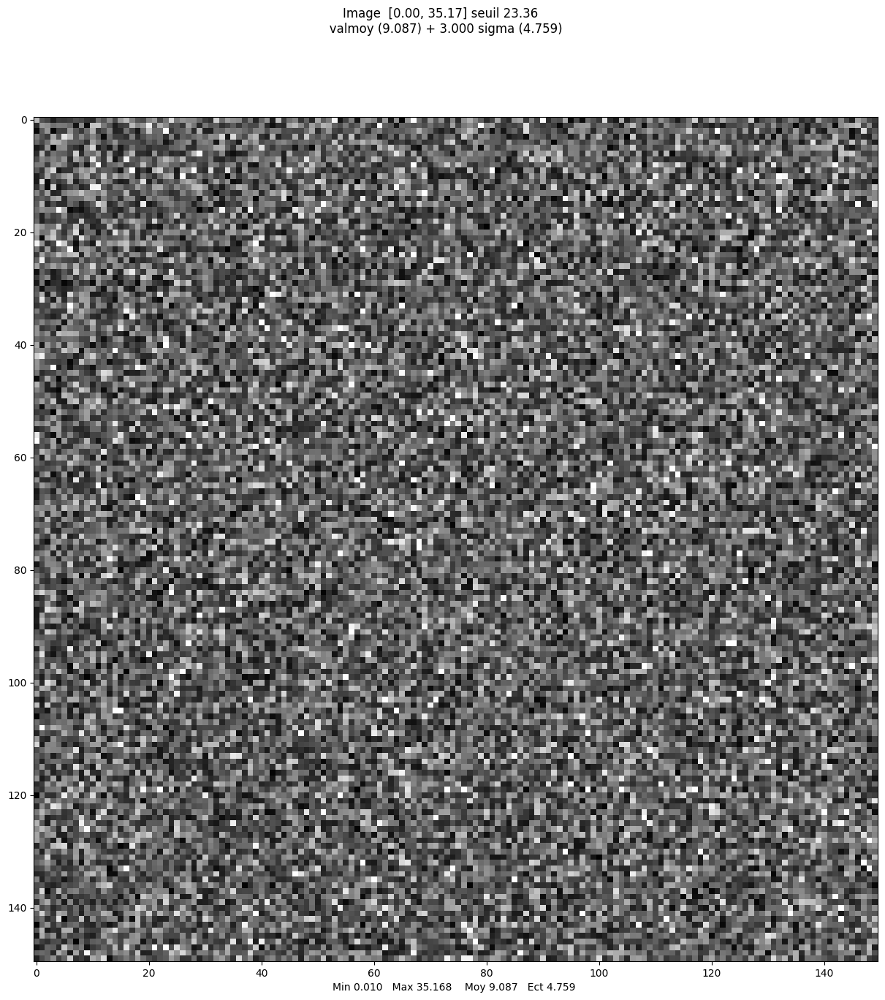

array([[16.93134385,  7.66390407,  6.23467162, ..., 11.56962626,
         6.91576827,  5.51266221],
       [ 4.0374728 , 13.80204689, 12.95272469, ...,  6.85780001,
        12.69430299,  4.38387713],
       [ 0.91496038,  8.49219869, 13.64498182, ..., 20.04504834,
         5.89610427,  8.01289949],
       ...,
       [ 1.93196015,  3.7445188 ,  9.38026503, ...,  8.48617211,
        17.48262751,  2.71652253],
       [ 8.72139415,  9.80970678,  9.04163256, ...,  7.95293572,
        15.80799932,  7.44123823],
       [ 3.10267123,  6.98351563,  9.23952627, ..., 15.84350108,
         5.85764575,  4.50159827]])

In [4]:
# Chose the reflectivity of the homogeneous area
R = np.random.uniform(100, 200) #complete

# Simulate the corresponding SLC image
re = np.random.normal(loc=0, scale=np.sqrt(R/2), size=(150,150))
im = np.random.normal(loc=0, scale=np.sqrt(R/2), size=(150,150))
ima_slc = re + 1j * im #complete
mvalab.visusar(np.abs(ima_slc))

#### Data distributions for an homogeneous area

compute the distribution of the phase and intensity of your image.
Then, estimate the coefficient of variation:  
$\gamma=\frac{\sigma}{\mu}$ using intensity data (square of the modulus of the complex field)

In [6]:
# Compute the intensity and the phase
ima_int = np.abs(ima_slc)**2 #complete
ima_ph = np.angle(ima_slc) #complete

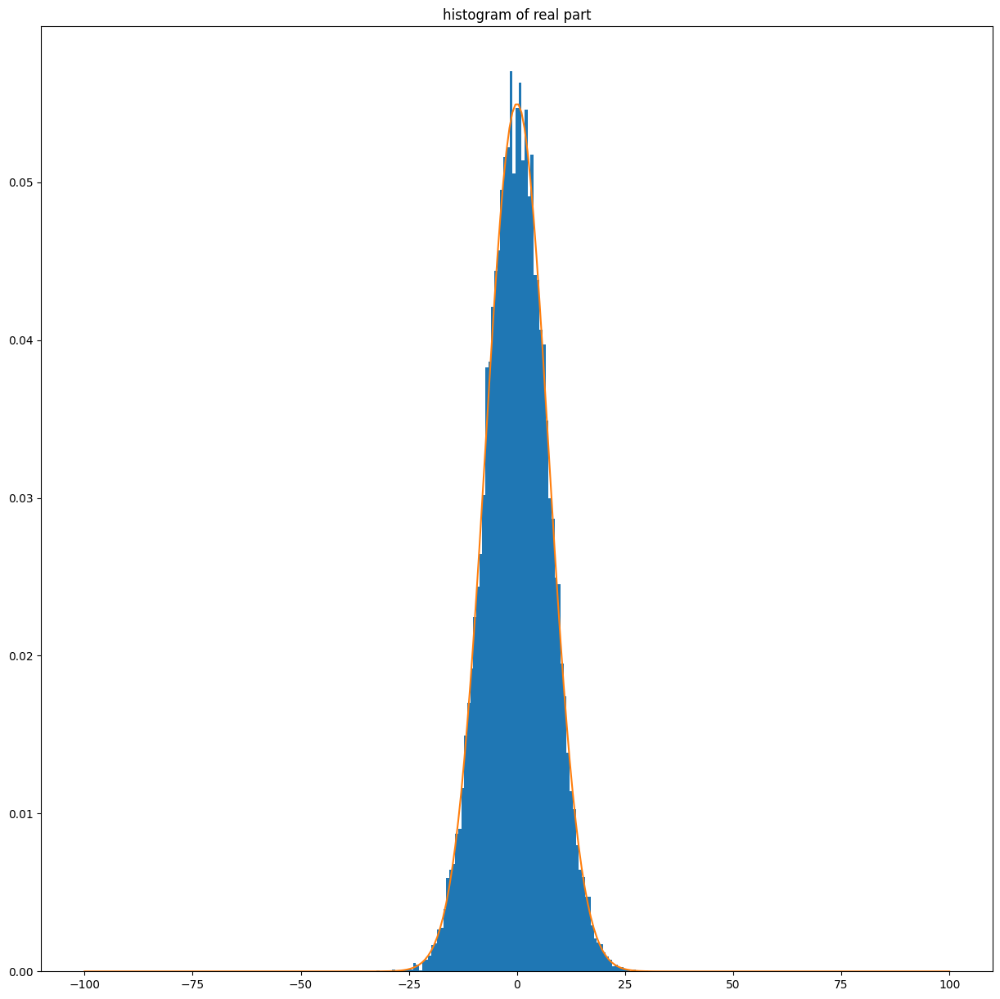

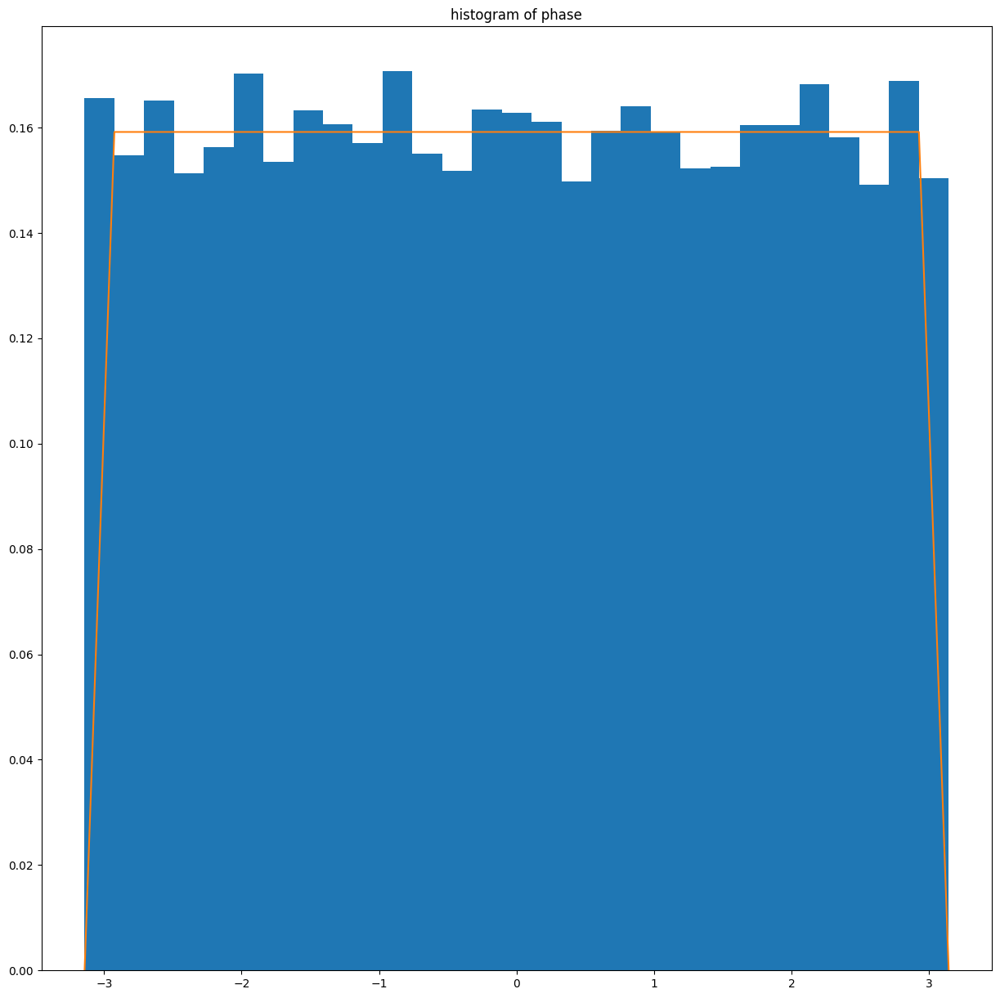

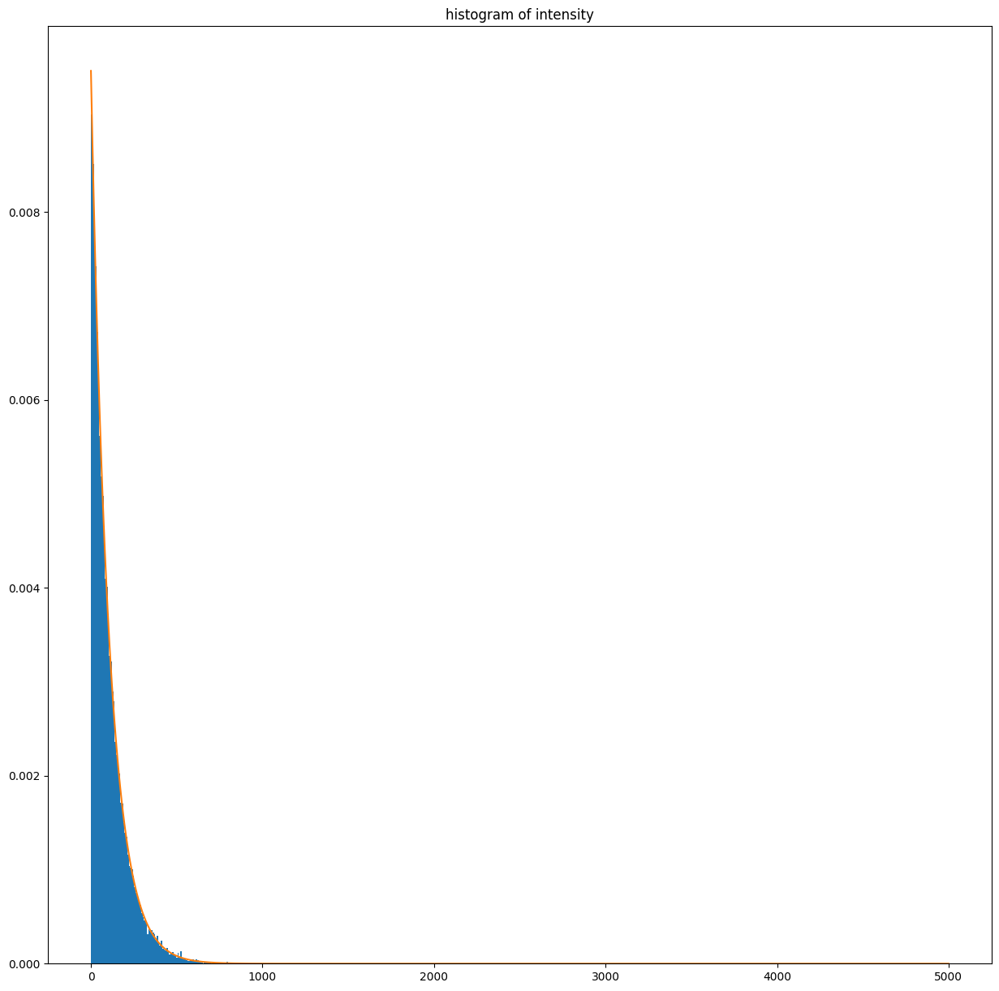

In [7]:
# Plot the histograms and verify they match the theoretical distribution
# Use the right range of values to plot the histogram
# Choose the right distribution to do the fitting

# fitting of the distributions
# use the following ones :
# Gaussian pdf : scipy.stats.uniform
# Rayleigh pdf : scipy.stats.rayleigh
# Exponential pdf : scipy.stats.expon

#example for real part of the data
plt.figure()
_, bins, _ = plt.hist(np.real(ima_slc).ravel(),bins='auto',density=True,range=[-100,100])  # Gaussian distribution
mu, sigma = scipy.stats.norm.fit(np.real(ima_slc))
best_fit_line = scipy.stats.norm.pdf(bins, mu, sigma)
plt.plot(bins, best_fit_line)
plt.title('histogram of real part')
plt.show()


#complete for phase data: Uniform distribution
plt.figure()
_, bins, _ = plt.hist(ima_ph.ravel(), bins='auto', density=True, range=[-np.pi, np.pi])
mu, sigma = scipy.stats.uniform.fit(ima_ph)
best_fit_line = scipy.stats.uniform.pdf(bins, mu, sigma) #complete
plt.plot(bins, best_fit_line)
plt.title('histogram of phase')
plt.show()


#complete for intensity data: Exponential (Gamma) distribution
plt.figure()
_, bins, _ = plt.hist(ima_int.ravel(), bins='auto', density=True, range=[0, 5000])
mu, sigma = scipy.stats.expon.fit(ima_int, floc=0)
best_fit_line = scipy.stats.expon.pdf(bins, mu, sigma) #complete
plt.plot(bins, best_fit_line)
plt.title('histogram of intensity')
plt.show()

In [8]:
# Compute the coefficient of variation on the homogeneous area in intensity

m_I = np.mean(ima_int)
sigma_I = np.std(ima_int)
coeff_var_I = sigma_I/m_I
print(coeff_var_I)

1.0038287294872361


### Question A.1.

Did you find the distributions seen in the course ? (recapitulate them).
Did you find the correct value for the coefficient of variation ? Could this coefficient be less than the theoretical value ?

### Answer A.1.
We can see that the distribution for the real part follows a gaussian distribution.
The phase is close to a uniform distribution and the intensity is also close to the exponential.

We should theoretically find a coefficient equal or superior to 1. Because the area is quite homogeneous it should be really close to 1. The coefficient of variation we find is indeed close to one.

The coefficient cannot be less than one as it represents an homogeneous area.

## B. Computation of the Equivalent Number of looks on homogeneous areas
In this part you have at your disposal 2 images of a part a ocean (São-Paulo) and a part of a field (Bologne, Italy). The first is acquired by Sentinel-1 GRD, and the second by TerraSAR-X GRD. The multi-looking has been done by the data provider (ESA, European Space Agency).

Use the value of the coefficient of variation to find the Equivalent Number of Looks (ENL) of the Sentinel-1 GRD and TerraSAR-X GRD data.
The formula is :
- $\gamma_I=\frac{1}{\sqrt{L}}$ for intensity data

In [9]:
# Download the images
!wget "https://partage.imt.fr/index.php/s/M3yeW5ozcsHyigR/download/s1_grd_saopaulo.npy"
!wget "https://partage.imt.fr/index.php/s/TTRfS6XKCzSM6cS/download/tsx_grd_bologne.npy"

--2024-06-11 17:37:59--  https://partage.imt.fr/index.php/s/M3yeW5ozcsHyigR/download/s1_grd_saopaulo.npy
Resolving partage.imt.fr (partage.imt.fr)... 193.48.235.12
Connecting to partage.imt.fr (partage.imt.fr)|193.48.235.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2097280 (2.0M) [application/octet-stream]
Saving to: ‘s1_grd_saopaulo.npy’

s1_grd_saopaulo.npy 100%[===================>]   2.00M   629KB/s    in 3.3s    

2024-06-11 17:38:03 (629 KB/s) - ‘s1_grd_saopaulo.npy’ saved [2097280/2097280]

--2024-06-11 17:38:03--  https://partage.imt.fr/index.php/s/TTRfS6XKCzSM6cS/download/tsx_grd_bologne.npy
Resolving partage.imt.fr (partage.imt.fr)... 193.48.235.12
Connecting to partage.imt.fr (partage.imt.fr)|193.48.235.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2097280 (2.0M) [application/octet-stream]
Saving to: ‘tsx_grd_bologne.npy’

tsx_grd_bologne.npy 100%[===================>]   2.00M   631KB/s    in 3.2s    

2024-06-11

Affichage d'une image reelle
plt.show dans visusar : image 250 x 250


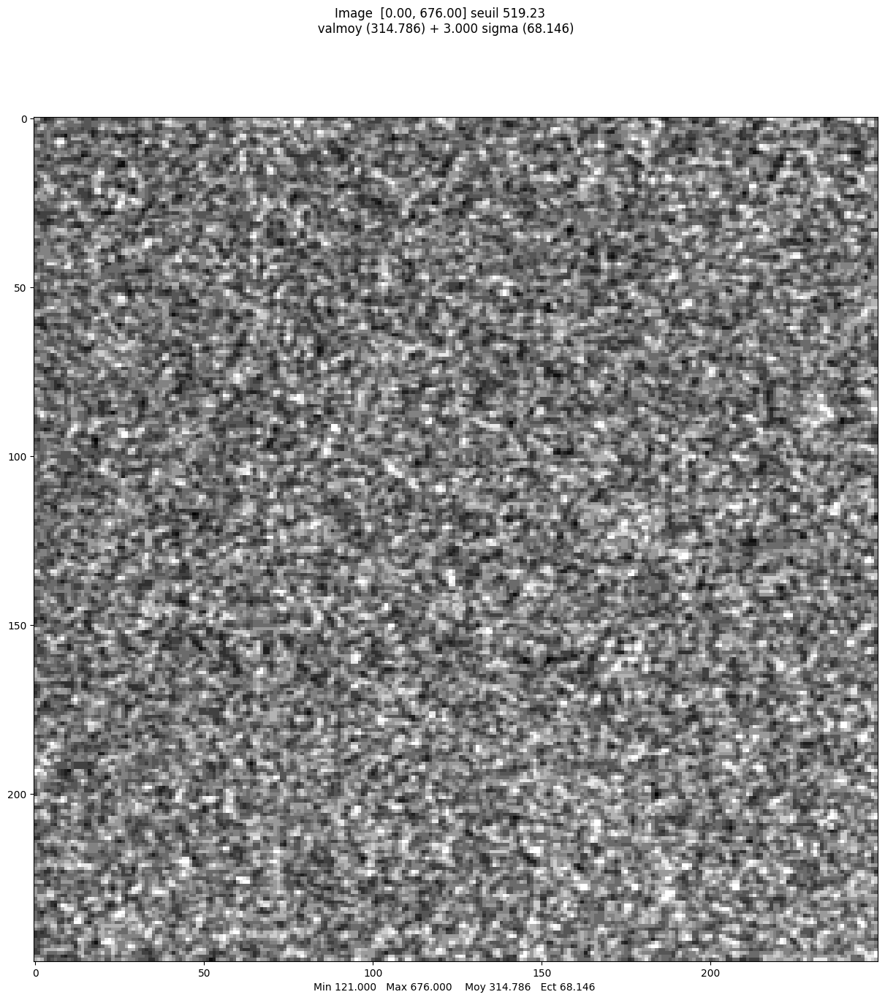

--- coeff var and L ---
0.21648477
21.33758686719461


In [10]:
im_s1grd = np.load("s1_grd_saopaulo.npy").astype(np.float32) #amplitude
im_s1grd_mer = im_s1grd[50:300, 100:350]
intensity_s1grd_mer = im_s1grd_mer ** 2
mvalab.visusar(intensity_s1grd_mer)

# compute coefficient of variation and number of looks
mean_intensity = np.mean(intensity_s1grd_mer)
std_intensity = np.std(intensity_s1grd_mer)

coeff_var_grd = std_intensity / mean_intensity #complete
L_grd = 1 / (coeff_var_grd ** 2) #complete
print('--- coeff var and L ---')
print(coeff_var_grd)
print(L_grd)

Affichage d'une image reelle
plt.show dans visusar : image 250 x 250


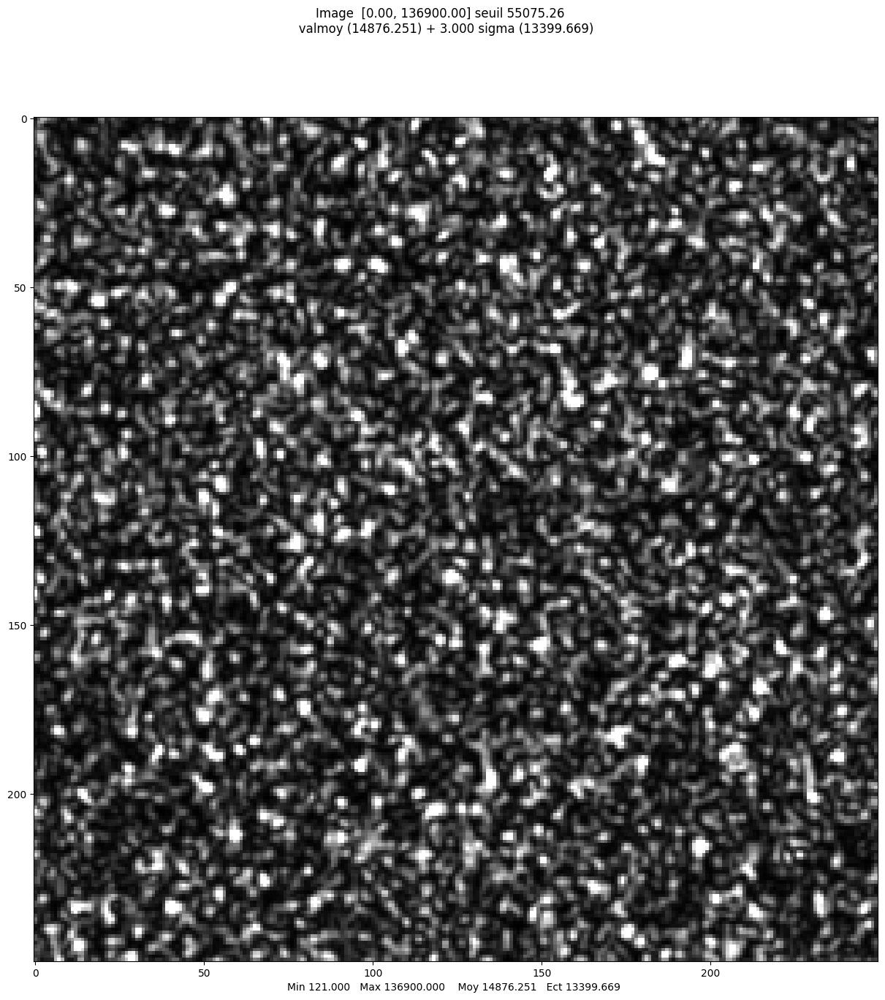

--- coeff var and L ---
0.90074235
1.2325337872691504


In [11]:
im_tsxgrd = np.load("tsx_grd_bologne.npy").astype(np.float32) #amplitude
im_tsxgrd_champ = im_tsxgrd[700:950, 300:550]
intensity_im_tsxgrd_champ = im_tsxgrd_champ ** 2
mvalab.visusar(intensity_im_tsxgrd_champ)

# compute coefficient of variation and number of looks
mean_intensity = np.mean(intensity_im_tsxgrd_champ)
std_intensity = np.std(intensity_im_tsxgrd_champ)

coeff_var_grd = std_intensity / mean_intensity #complete
L_grd = 1 / (coeff_var_grd ** 2) #complete
print('--- coeff var and L ---')
print(coeff_var_grd)
print(L_grd)




### Question B.1
Comment the number of looks you have found for GRD date from Sentinel-1 and TerraSAR-X (is it an integer value ? why not ? what does it mean ?).

### Answer B.1

We don't get integer calues for the number of looks. This means that we cannot assume that they are iid.

## C. Spatial multi-looking and implementation of the Lee filter

In this part we will try simple speckle reduction method using the following step :
- first we will compute a mean filter
- then we will compute the local coefficient of variation (using the same size for the moving window)
- finally we will combine these two results to obtain the Lee filter.

## C.1 Computation of the mean filter
Compute the mean filter using a 2D convolution.

In [12]:
# Download the image
!wget "https://partage.imt.fr/index.php/s/cbRqjnSJEfD2zJ8/download/tsx_slc_rome.npy"

--2024-06-11 17:38:23--  https://partage.imt.fr/index.php/s/cbRqjnSJEfD2zJ8/download/tsx_slc_rome.npy
Resolving partage.imt.fr (partage.imt.fr)... 193.48.235.12
Connecting to partage.imt.fr (partage.imt.fr)|193.48.235.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8388736 (8.0M) [application/octet-stream]
Saving to: ‘tsx_slc_rome.npy’

tsx_slc_rome.npy    100%[===================>]   8.00M   652KB/s    in 13s     

2024-06-11 17:38:36 (643 KB/s) - ‘tsx_slc_rome.npy’ saved [8388736/8388736]



Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


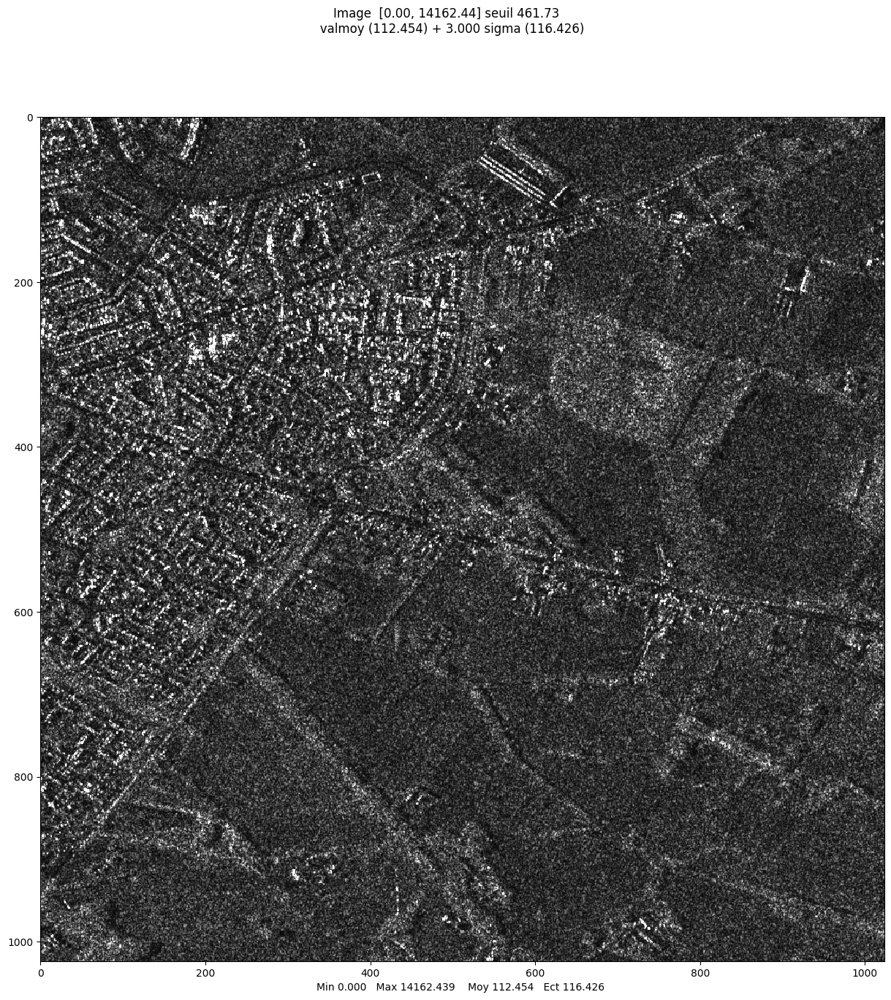

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


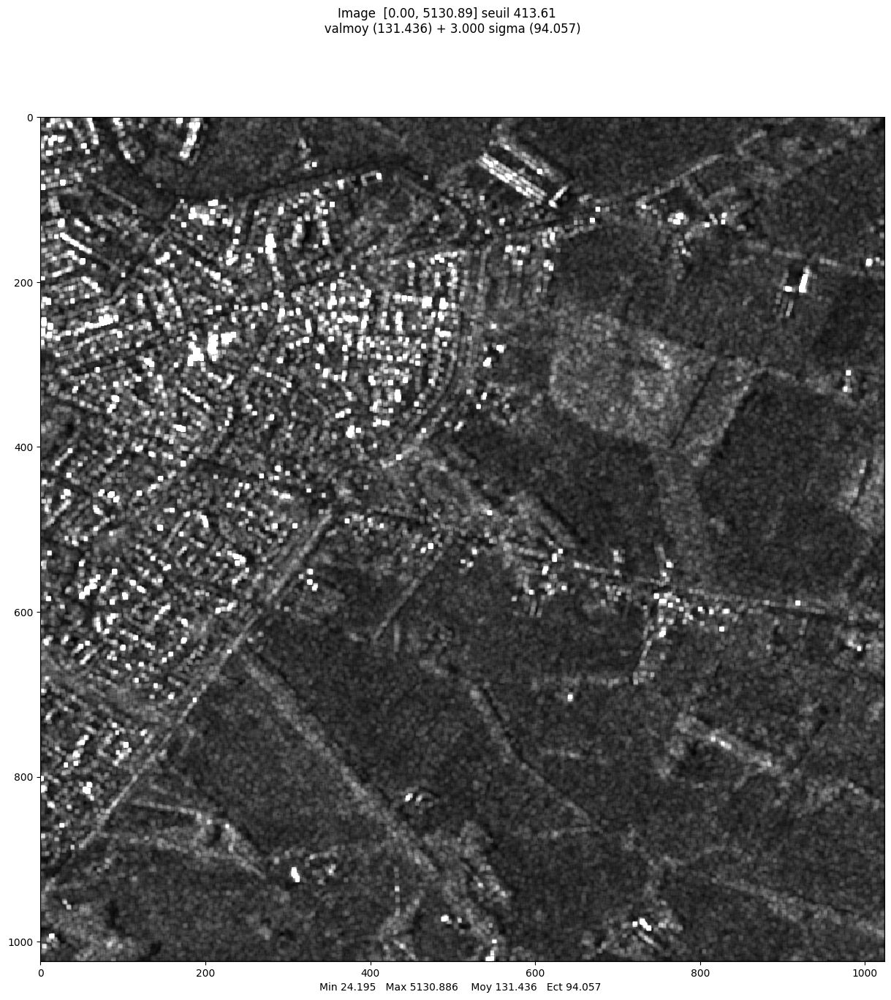

array([[244.69352691, 246.28845302, 247.00073293, ...,  59.00237271,
         45.53152781,  38.87158333],
       [255.80148973, 257.44941664, 258.27992976, ...,  62.28515082,
         49.21991524,  40.51172649],
       [264.17365841, 265.90276751, 266.84565156, ...,  66.19002917,
         53.12362953,  42.52857817],
       ...,
       [ 66.50593973,  76.51222137,  82.94238982, ..., 104.46549736,
         98.12359609,  96.9007746 ],
       [ 63.74511757,  73.15244367,  78.94580429, ...,  87.86580784,
         80.89450012,  79.50547249],
       [ 55.38989051,  62.12471336,  68.50839372, ...,  67.49933389,
         62.81273785,  61.61947776]])

In [13]:
from scipy.signal import convolve2d
ima_tsxslc = np.load("tsx_slc_rome.npy") #amplitude

# take the intensity
ima_int = np.abs(ima_tsxslc)**2 #complete
mvalab.visusar(np.sqrt(ima_int))

# create the average window
size_window = (5,5)
mask_loc = np.ones(size_window) / np.prod(size_window) #complete

# compute the mean image (intensity data)
ima_int_mean = convolve2d(ima_int, mask_loc, mode='same') #complete

# display the result
mvalab.visusar(np.sqrt(ima_int_mean))


### Question C.1
What is the effect of the mean filter ? (advantages and drawbacks). What is the influence of the window size ?



### Answer C.1
Overall the filter seams to reduce the noise in the homogeneous areas. However, we can see that the image is blurred and some details are lost.

The bigger the window, the less noise there will be but the blurrier the image will get.

## C.2 Lee filter

Given a neighborhood, the Lee filter of an image $I_s$ can be computed by the following steps:

*   Compute the local mean of the image $\hat{\mu}_{s}$
*   Compute $k_s$ given by:
$$
  k_s=1- \frac{\gamma_{Sp}^2}{\hat{\gamma}_s^2}
$$
where $\gamma_{Sp}$ is the theoretical value of the coefficient of variation for a pure speckle ($\gamma_{Sp}=\frac{1}{\sqrt{L}}$ for a L-look intensity image), and $\hat{\gamma}_s$ is the empirical value of the coefficient of variation for the given neighborhood.
*   Compute the final filtered image
$$
  \hat{I}_s= \hat{\mu}_{s}+k_s (I_s-\hat{\mu}_{s})
$$

Create a function performing Lee filter on an image, for a given neighborhood and number $L$ of look.

Then, knowing that a SLC image is a 1-look image, compute the Lee filter on the intensity image of "ima_tsxslc"

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


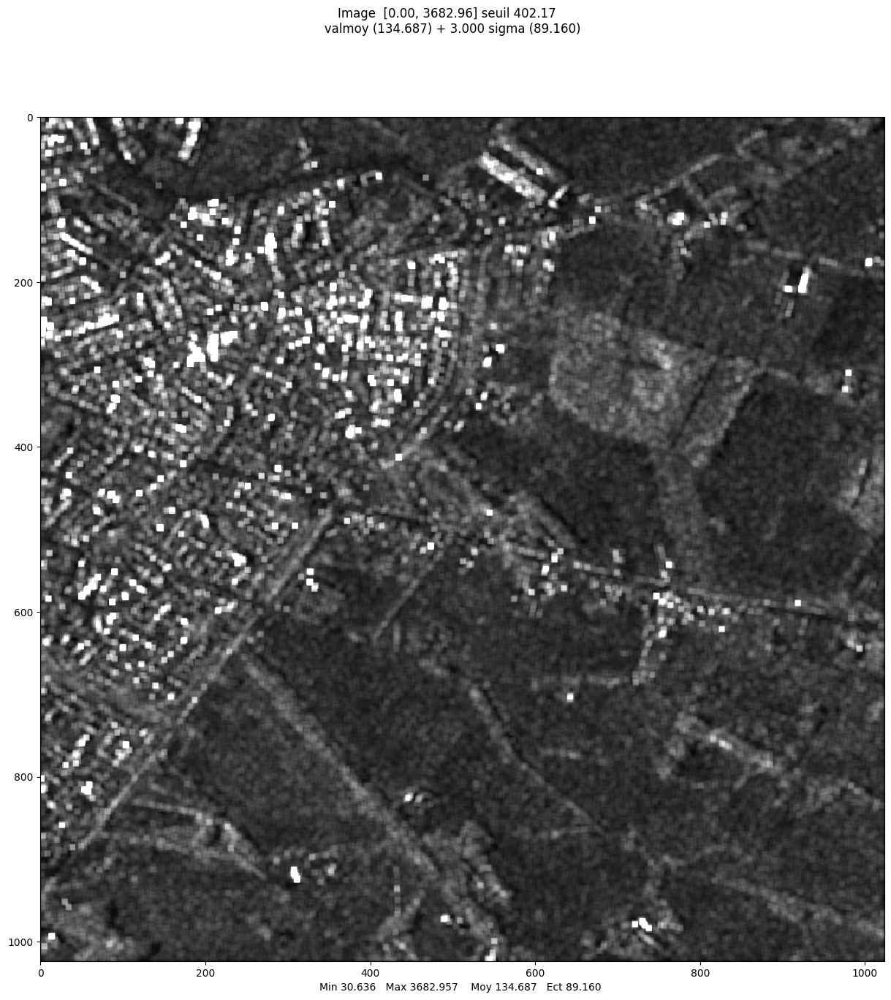

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


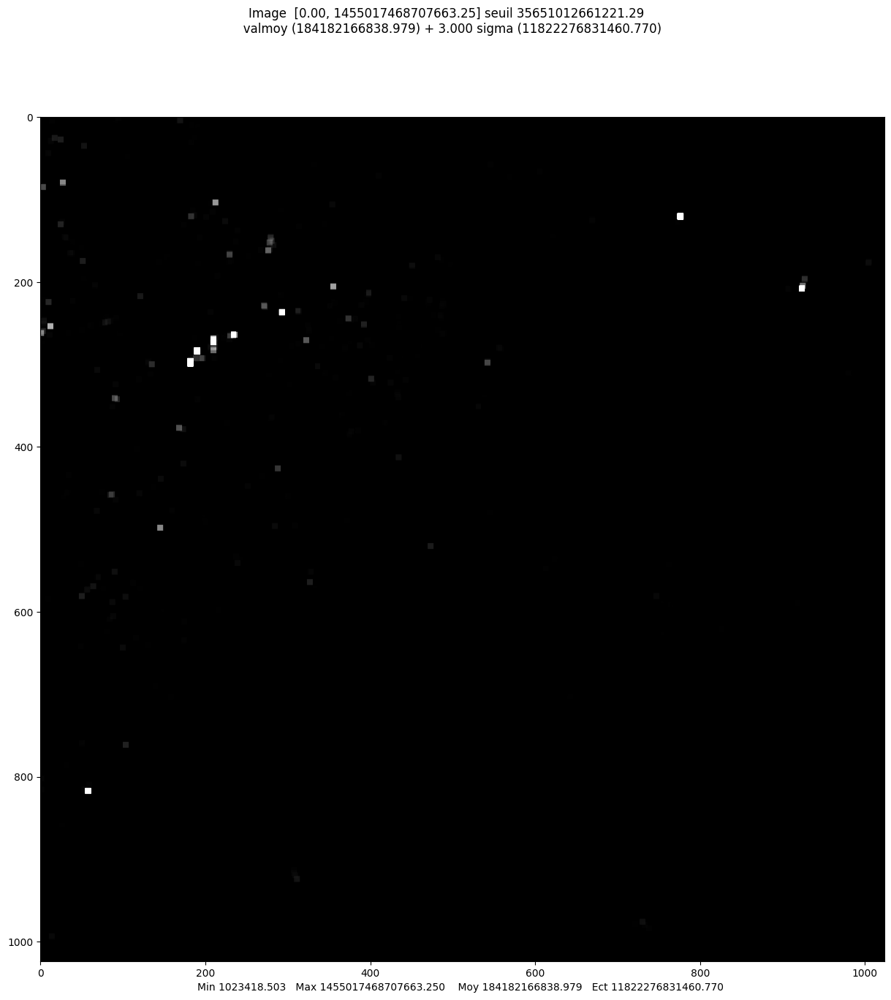

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


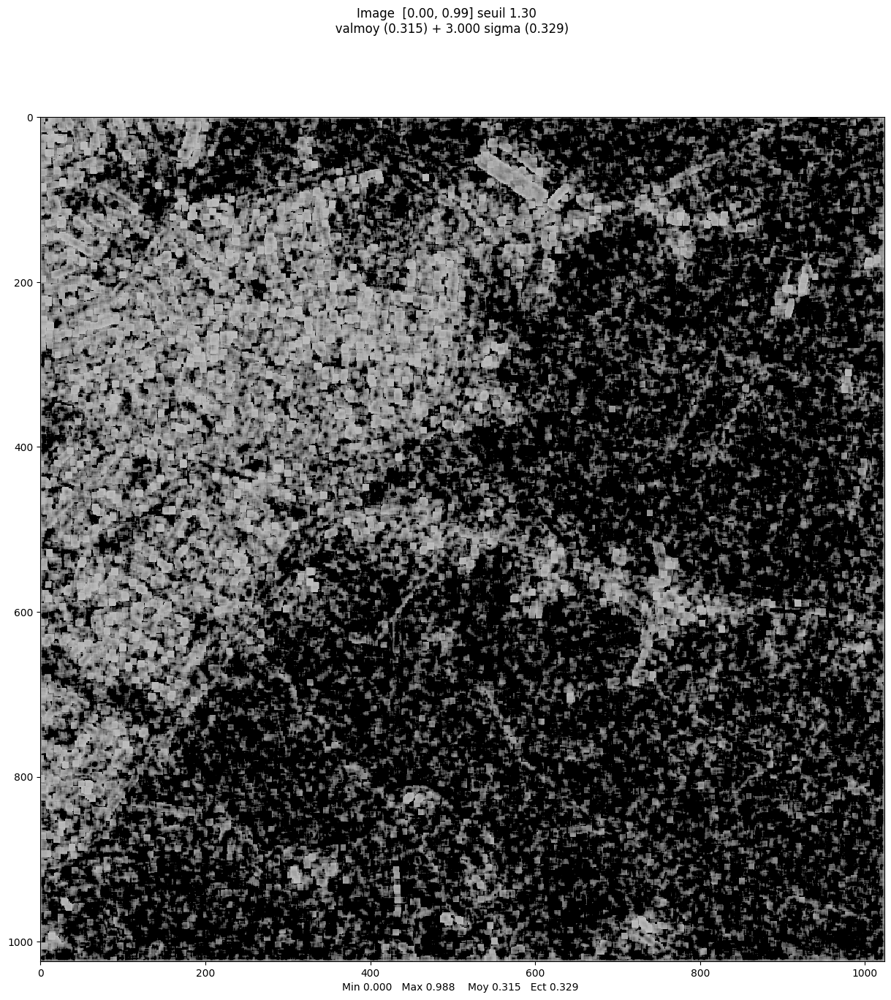

Affichage d'une image reelle
plt.show dans visusar : image 1024 x 1024


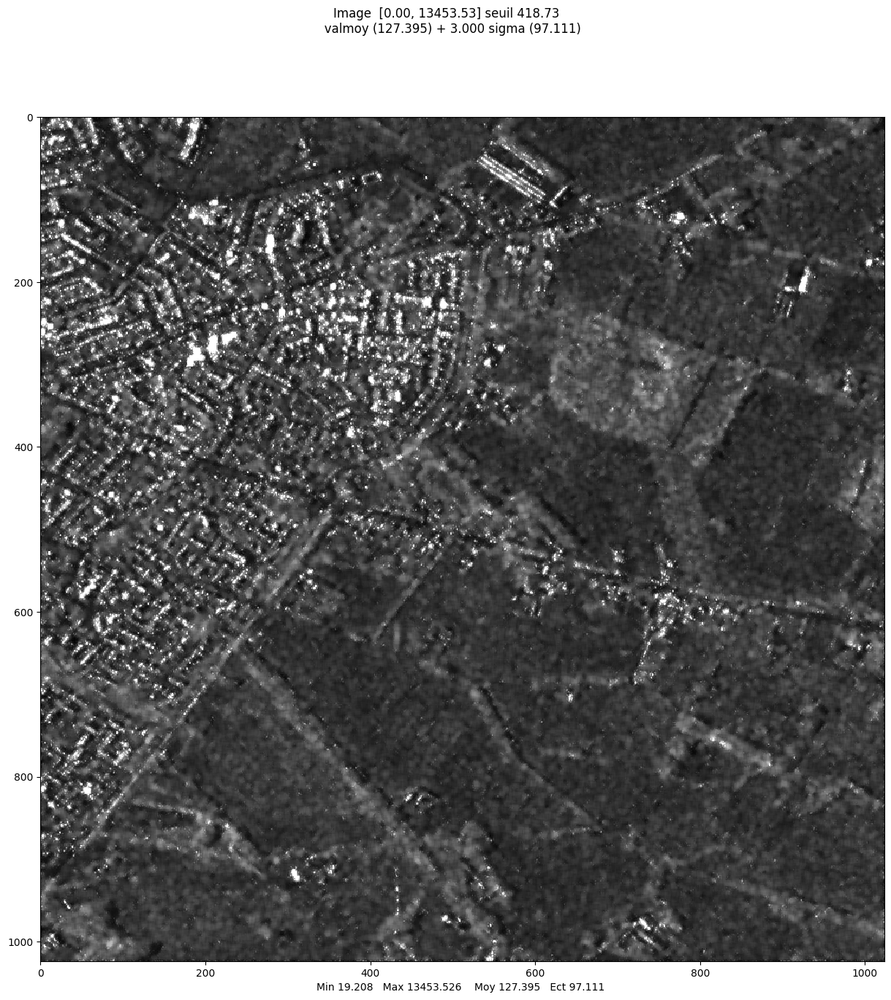

array([[144.00413727, 308.36183233, 418.72866519, ...,  64.55605282,
         86.24329446, 112.81753373],
       [190.04858887, 418.72866519, 418.72866519, ...,  43.61261524,
         65.84179831,  29.56000307],
       [234.64043021, 418.72866519, 351.03721453, ...,  50.61296111,
         32.24712371,  28.44227807],
       ...,
       [ 84.26142301,  75.181164  ,  71.41213092, ..., 120.50446688,
         99.10429479,  51.0522139 ],
       [ 77.25169039,  93.77458808,  77.26014126, ...,  98.28983025,
         70.83758473, 106.03256301],
       [ 53.89435933,  56.73688736,  91.1884864 , ...,  93.50540263,
         48.2759747 , 115.68994217]])

In [15]:
def lee_filter(im, neighborhood=7, L=1, visualize=False):

  # Mask
  mask = np.ones((neighborhood, neighborhood)) #complete

  # Compute local mean image
  im_mean = convolve2d(im, mask / mask.sum(), mode='same') #complete

  # Compute local coefficient of variation (thanks to local variance and local mean)
  im_sqr_mean = convolve2d(im**2, mask / mask.sum(), mode='same')
  im_var = im_sqr_mean - im_mean**2 #complete

  ks = 1 - ((1.0 / np.sqrt(L))**2 / (np.sqrt(im_var) / im_mean)**2) #complete
  ks = np.clip(ks, 0, 1)

  # Compute Lee filter
  filtered_im = im_mean + ks * (im - im_mean) #complete

  # Visualizations
  if visualize:
    mvalab.visusar(np.sqrt(im_mean))
    mvalab.visusar(im_var)
    mvalab.visusar(np.sqrt(ks))

  return filtered_im


lee_filtered_int = lee_filter(ima_int, neighborhood=7, L=1, visualize=True) #complete
mvalab.visusar(np.sqrt(lee_filtered_int))

### Question C.2
Which information is enhanced in the image of the local standard deviation ? In the image of the local coefficient of variation ? Which one is the more useful ?

### Answer C.2

In the standard deviation image, the bright points are more visible as they hold a higher local variance.

The local coefficient of variation shows the areas of the image which are not homogeneous.

The second one contains more information

### Question C.3

Compare the results of the mean filter and the Lee filter. Study the influence of the size of the window of the filters.


### Answer C.3

The Lee filter smooth more the homogeneous areas and also gives better results for the heterogeneous areas overall.

If we use a larger window, the homogeneous areas will be smoother and more blurred.

## Filtering of image "Lely" and comparison with a deep learning algorithm
In this part, we will repeat the process done above to denoise a crop of image "Lely" using the Lee filter. Then, we will compare it with the result of a deep learning algorithm called SAR2SAR (https://arxiv.org/abs/2006.15037).

## C.4 Denoised image: SAR2SAR
The Lee filter presents some limits. More recent approaches to suppress noise rely on sofisticated algorithms. You can plot the image of Lely denoised using a deep learning algorthm called SAR2SAR and compare visually the result with the image filtered using the Lee filter.
  

In [16]:
# Download the image
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.dim

--2024-06-11 18:04:29--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 52428800 (50M)
Saving to: ‘lely_tuple_multitemp.IMA’

lely_tuple_multitem 100%[===================>]  50.00M  12.3MB/s    in 6.2s    

2024-06-11 18:04:36 (8.04 MB/s) - ‘lely_tuple_multitemp.IMA’ saved [52428800/52428800]

--2024-06-11 18:04:36--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/multitemp/lely_tuple_multitemp.dim
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29
Savi

imz2mat : version janvier 2018.  Fichier à ouvrir : lely_tuple_multitemp.IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
Dans ximaread : lecture du canal 0/25
image en .IMA
image en .IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
image en .ima  512   512   canaux: 25  verif :  1
512 512
-type CFLOAT
lecture de  lely_tuple_multitemp.IMA  en quelconque 512 512 25  offset  0 <f 4  complex 1 blocksize 2097152
Boucle de lecture entre 0 et 25   sur 25 canaux
Lecture du canal 1/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 2/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 3/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 4/25
Données complexes (standard). Nouvelle version de imz2mat  <f
Lecture du canal 5/25
Données complexes (standard). Nouvelle version de imz2mat 

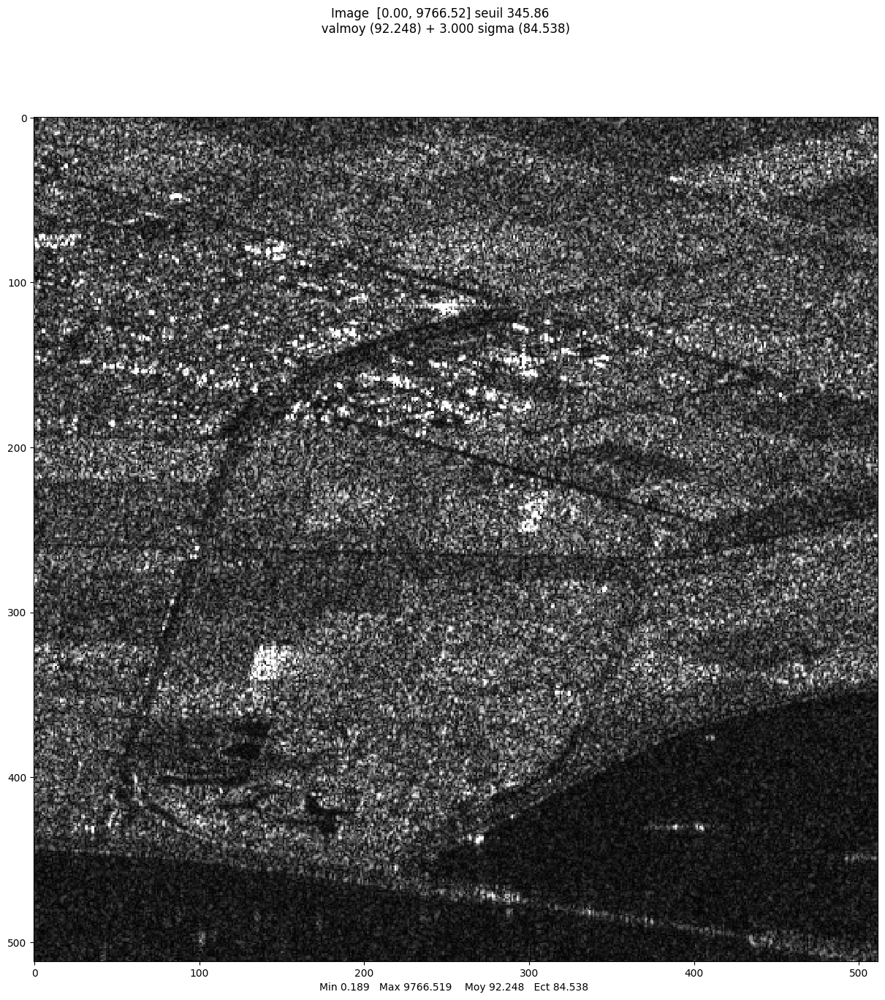

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


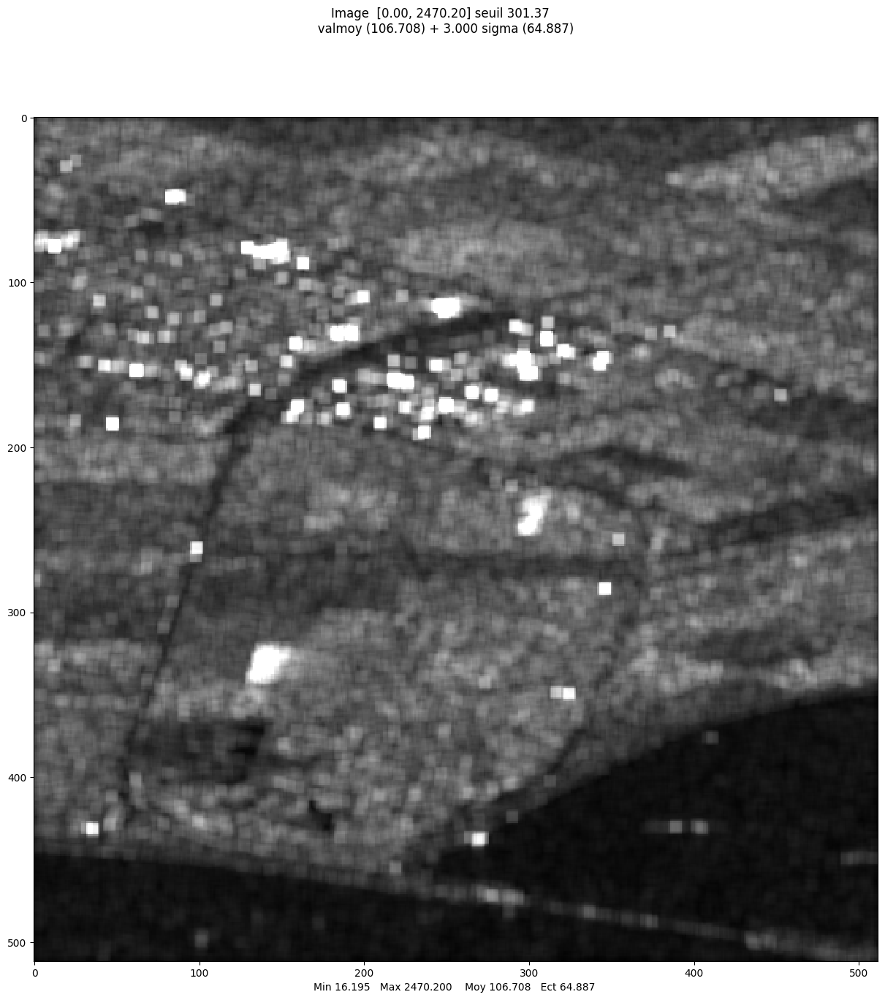

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


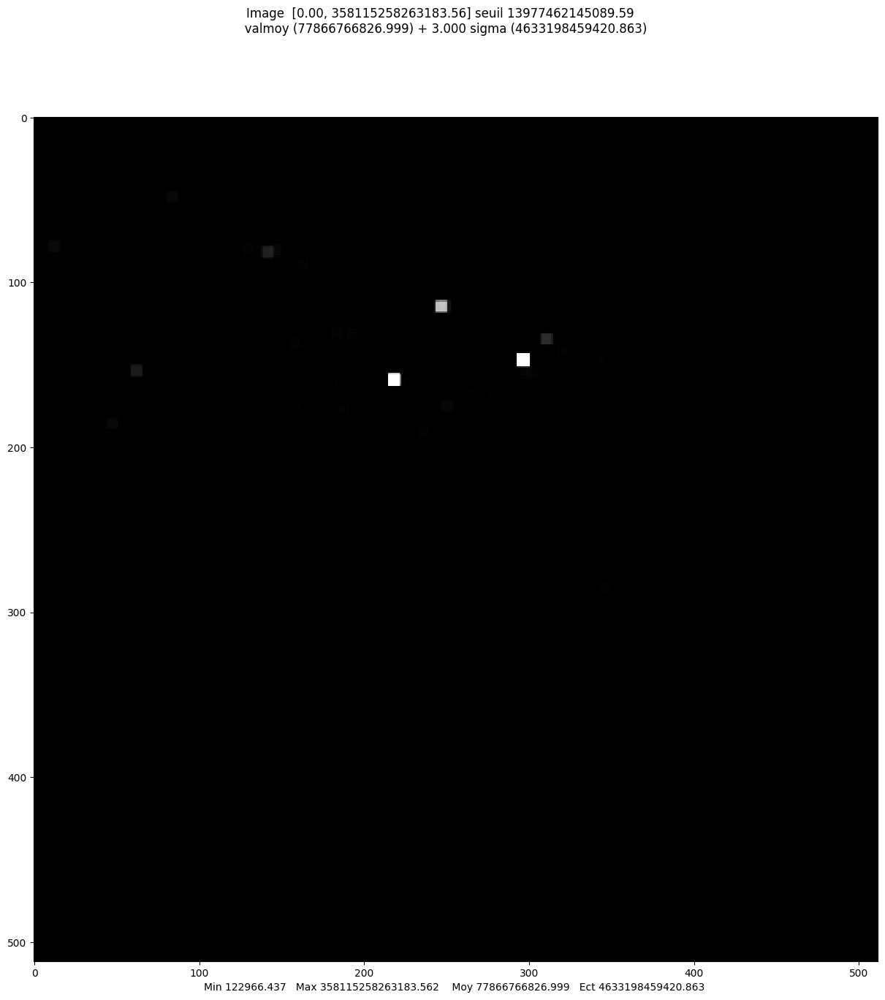

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


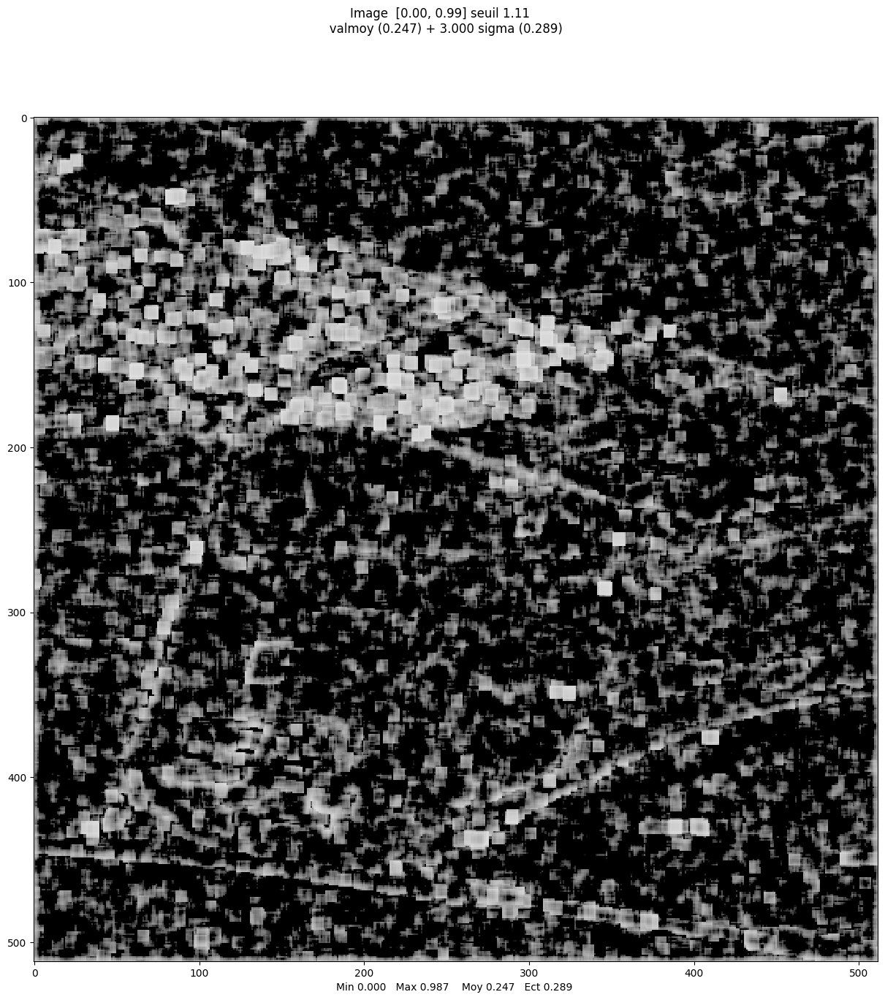

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


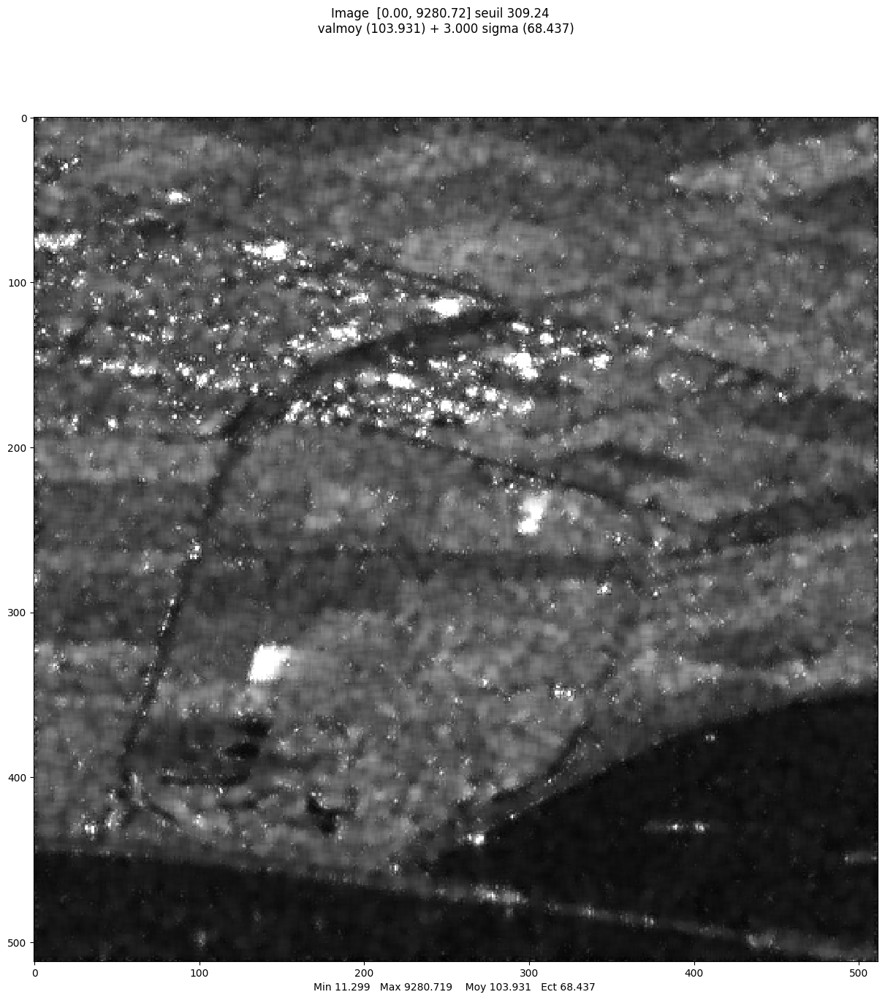

array([[ 77.42145081,  60.57726231,  83.83170578, ...,  43.65446769,
         42.33217855,  46.88156881],
       [ 47.869043  ,  52.86934886,  52.8235984 , ..., 120.65639836,
         90.12296035,  41.31860317],
       [ 56.93129422,  82.0020663 ,  74.30037708, ..., 110.16119263,
        116.76405434,  75.10916861],
       ...,
       [ 29.19809719,  31.70052529,  28.58914586, ...,  73.17288733,
         51.27087521,  62.14106404],
       [ 19.47862472,  31.21831959,  34.6055486 , ...,  76.36410083,
         55.47956716,  73.65145118],
       [ 24.60171053,  44.89194795,  19.98769651, ...,  76.06644646,
         35.93479203, 101.22668942]])

In [17]:
part_lely_slc = mvalab.imz2mat('lely_tuple_multitemp.IMA')[0] #date is on thrid axis of part_lely_slc
part_lely_slc = np.abs(part_lely_slc[:,:,0])**2 #single look complex image
mvalab.visusar(np.sqrt(part_lely_slc))

# using your previous code, filter the image part_lely_int with the Lee filter
lee_filtered_int = lee_filter(part_lely_slc, neighborhood=7, L=1, visualize=True) #complete
mvalab.visusar(np.sqrt(lee_filtered_int))

--2024-06-11 18:04:51--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 26214400 (25M)
Saving to: ‘lely_tuple_multitemp_SAR2SAR.IMA’

lely_tuple_multitem 100%[===================>]  25.00M  19.0MB/s    in 1.3s    

2024-06-11 18:04:53 (19.0 MB/s) - ‘lely_tuple_multitemp_SAR2SAR.IMA’ saved [26214400/26214400]

--2024-06-11 18:04:53--  https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.dim
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sen

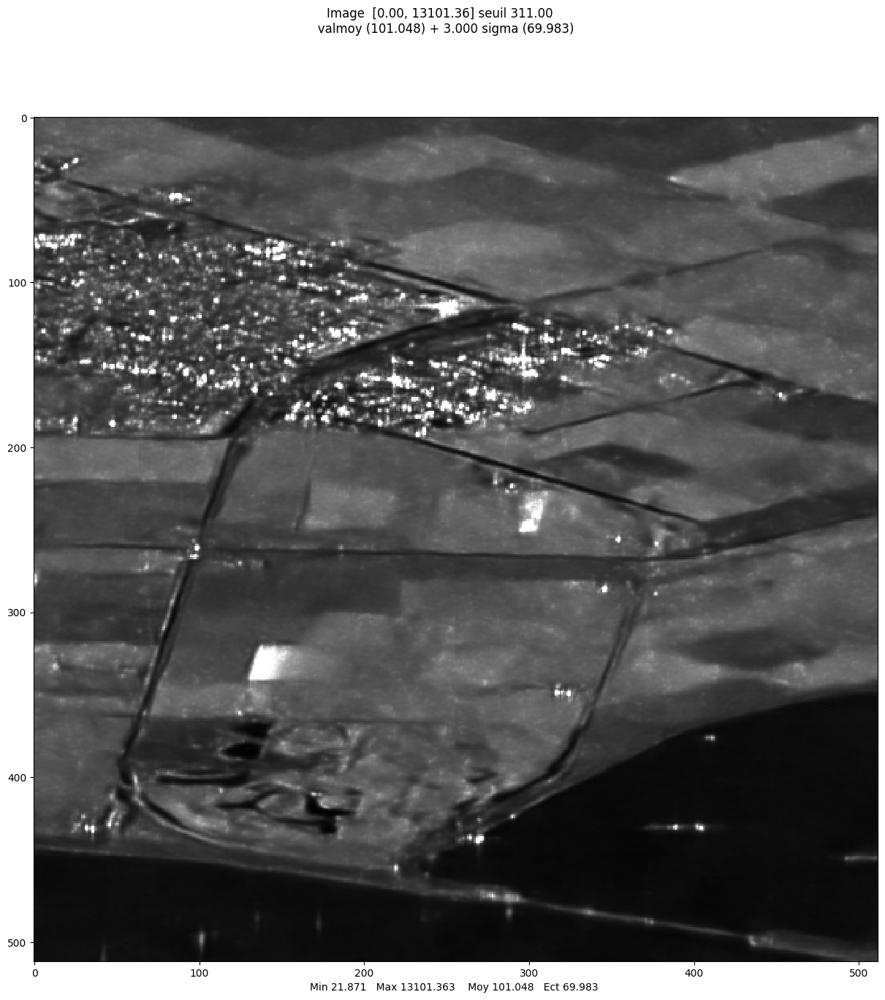

array([[108.26735687, 108.92593384, 117.21216583, ...,  87.13925171,
         89.79171753,  89.75721741],
       [105.54544067, 111.25749207, 116.15348053, ...,  95.23865509,
         96.19988251,  95.58480072],
       [105.72384644, 114.29315186, 116.50016022, ..., 100.59217072,
        100.78230286, 100.22771454],
       ...,
       [ 40.31035233,  38.88003159,  38.09856415, ...,  82.76222992,
         81.49038696,  81.83437347],
       [ 39.99552917,  38.5390358 ,  38.96235657, ...,  84.42482758,
         84.06273651,  83.64545441],
       [ 40.69298935,  38.59126282,  38.61891174, ...,  81.21070862,
         82.10493469,  87.46295166]])

In [18]:
# this image has already been processed by a CNN based filter
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
!wget https://perso.telecom-paristech.fr/tupin/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.dim
im_lely_multitemp_denoised = mvalab.imz2mat('lely_tuple_multitemp_SAR2SAR.IMA')
im1_d = np.abs(im_lely_multitemp_denoised[0][:,:,0]) #amplitude
mvalab.visusar(im1_d)

### Question C.4
Do a comparison between the CNN filtering and the Lee filter. Comment the two results. Are homogeneous areas well restored? Do the methods preserve edges and fine structures? Are artifacts introduced?

### Answer C.4

The CNN seems to give better results than the Lee filter. We can clearly see the different smooth areas while denoising the heterogeneous zone. It preserves the structures and details. The Lee filter gives great results but it remains noisy in some parts.

## C.5 Method noise
Performances of a denoising algorithm can be visually interpreted by looking at the *residual noise* (i.e. the ratio between the noisy image and the denoised image, in intensity). For a quantitative evaluation, we can look at the noise statistics, knowing that, in intensity, statistics of speckle S are:
- $\mu_S=1$
- $\sigma^2_S = \frac{1}{L}$

### Question C.5
Compute the aforementioned ratio image, mean value and variance for the image restored using the Lee filter and the result of SAR2SAR. Comment the results.

What is the interest of computing the method noise ? What are your conclusions for the two previous filters ?

### Answer C.5

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


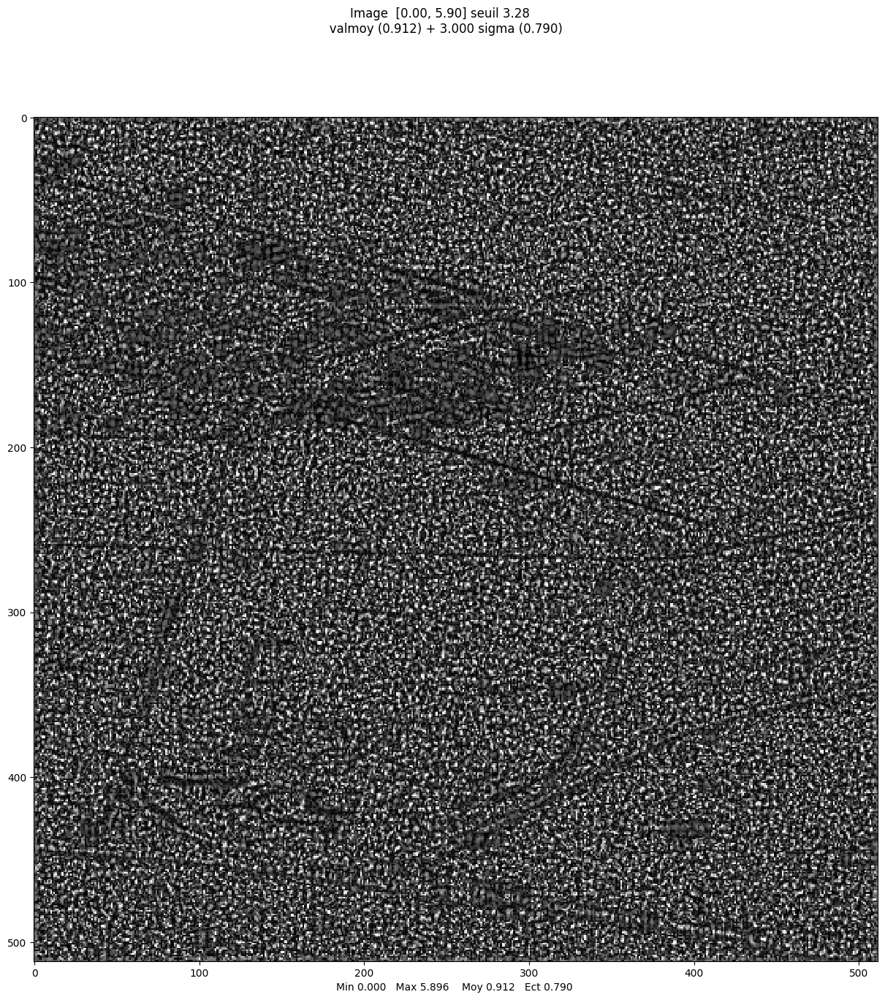

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


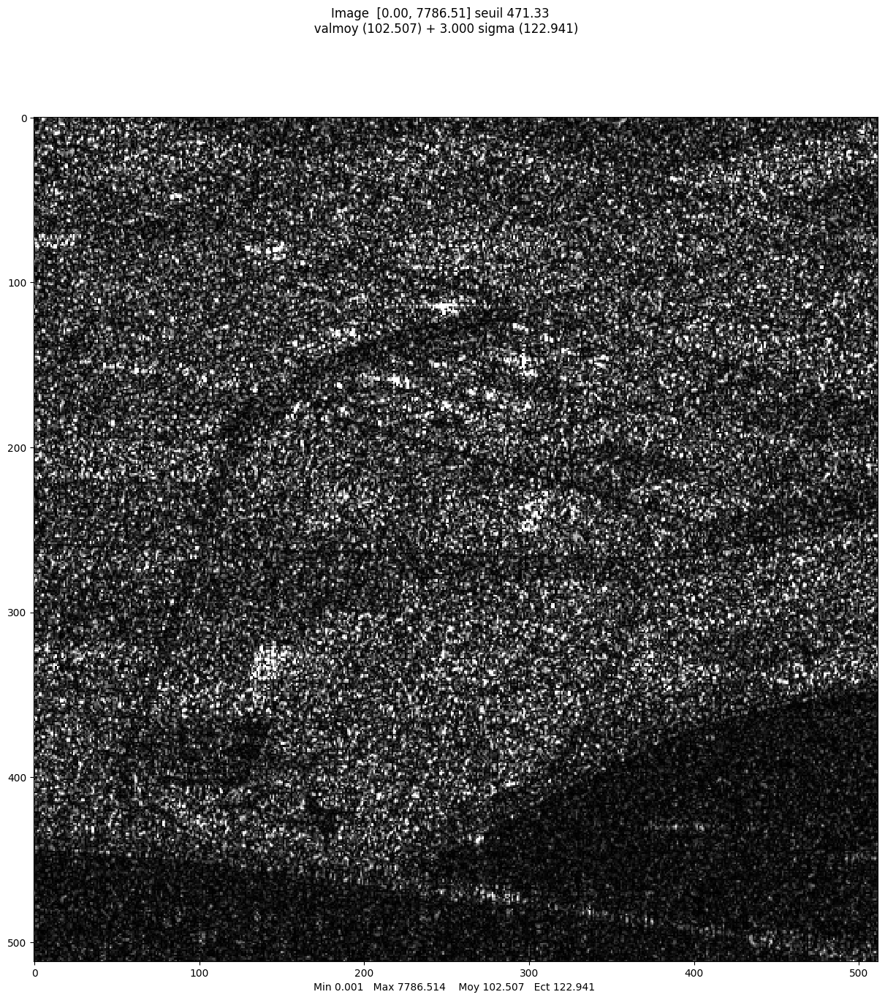

LEE FILTER: mean = 0.9124167702926953 and var = 0.6236372730315285
SAR2SAR: mean = 102.50694511619228 and var = 15114.57611953478


In [19]:
# Plot the residual noise
res_noise_lee = (part_lely_slc) / lee_filtered_int #complete
mvalab.visusar(res_noise_lee)
mean_lee = np.mean(res_noise_lee)
var_lee = np.var(res_noise_lee)

res_noise_deep = part_lely_slc/im1_d #complete
mvalab.visusar(res_noise_deep)
mean_deep = np.mean(res_noise_deep)
var_deep = np.var(res_noise_deep)

print('LEE FILTER: mean = '+str(mean_lee)+' and var = '+str(var_lee))
print('SAR2SAR: mean = '+str(mean_deep)+' and var = '+str(var_deep))